Importing the libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt

z = np.load("data_numpy/2nm_QD_AFMs_AIX6461_along_the_flat_edge_1um_200pN_15gain_2um_zrange.0_00000/channel_00___0_data.npy")
z_nobackground = z - np.mean(z)

Image histgram equalisation to see if we can make the dots brighter 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure


# Load AFM height data
file_path = (
    "data_numpy/"
    "2nm_QD_AFMs_AIX6461_along_the_flat_edge_1um_200pN_15gain_2um_zrange."
    "0_00000/channel_00___0_data.npy"
)

z = np.load(file_path)

# Remove constant background offset
z_nobackground = z - np.mean(z)

# Handle NaN or infinite values if present
finite_mask = np.isfinite(z_nobackground)

if not np.any(finite_mask):
    raise ValueError("The array contains no finite values.")

# Fill invalid pixels temporarily for equalisation
z_clean = z_nobackground.copy()
z_clean[~finite_mask] = np.median(z_nobackground[finite_mask])

# Histogram equalisation
# Output is normalized approximately to [0, 1]
z_equalized = exposure.equalize_hist(
    z_clean,
    mask=finite_mask
)

# Restore invalid pixels
z_equalized[~finite_mask] = np.nan


# Use common percentile limits for displaying the original data
vmin, vmax = np.nanpercentile(z_nobackground, [1, 99])

fig, axes = plt.subplots(
    2,
    2,
    figsize=(12, 9),
    constrained_layout=True
)

# Before image
im0 = axes[0, 0].imshow(
    z_nobackground,
    cmap="gray",
    vmin=vmin,
    vmax=vmax
)
axes[0, 0].set_title("Before histogram equalisation")
axes[0, 0].set_axis_off()
fig.colorbar(
    im0,
    ax=axes[0, 0],
    label="Height relative to mean"
)

# After image
im1 = axes[0, 1].imshow(
    z_equalized,
    cmap="gray",
    vmin=0,
    vmax=1
)
axes[0, 1].set_title("After histogram equalisation")
axes[0, 1].set_axis_off()
fig.colorbar(
    im1,
    ax=axes[0, 1],
    label="Equalised intensity"
)

# Before histogram
axes[1, 0].hist(
    z_nobackground[finite_mask].ravel(),
    bins=256,
    density=True
)
axes[1, 0].set_title("Histogram before")
axes[1, 0].set_xlabel("Height relative to mean")
axes[1, 0].set_ylabel("Density")

# After histogram
axes[1, 1].hist(
    z_equalized[finite_mask].ravel(),
    bins=256,
    range=(0, 1),
    density=True
)
axes[1, 1].set_title("Histogram after")
axes[1, 1].set_xlabel("Equalised intensity")
axes[1, 1].set_ylabel("Density")

plt.show()

## Bandpass filter to reduce noise in the background

In [2]:
from __future__ import annotations

import numpy as np
from scipy.ndimage import gaussian_filter


def fft_bandpass(
    image: np.ndarray,
    low_sigma: float = 1,
    high_sigma: float = 10,
) -> np.ndarray:
    """
    Band-pass filter an AFM image using Fourier space.

    Keeps intermediate spatial frequencies:
    - removes slow background variations
    - removes high-frequency noise

    Parameters
    ----------
    image:
        2D AFM height array

    low_sigma:
        Controls removal of high-frequency noise.
        Smaller = keep finer details.

    high_sigma:
        Controls removal of background.
        Larger = remove larger structures.

    Returns
    -------
    filtered_image:
        Band-pass filtered AFM image
    """

    image = np.asarray(image, dtype=float)

    # remove mean height
    image = image - np.mean(image)

    # FFT
    F = np.fft.fftshift(np.fft.fft2(image))

    ny, nx = image.shape

    y, x = np.indices(image.shape)

    cx = nx // 2
    cy = ny // 2

    r = np.sqrt(
        (x - cx)**2 +
        (y - cy)**2
    )

    # Fourier Gaussian masks
    low_pass = np.exp(
        -(r**2)/(2*high_sigma**2)
    )

    high_pass = 1 - np.exp(
        -(r**2)/(2*low_sigma**2)
    )

    bandpass_mask = low_pass * high_pass

    # apply filter
    F_filtered = F * bandpass_mask

    # inverse FFT
    filtered = np.real(
        np.fft.ifft2(
            np.fft.ifftshift(F_filtered)
        )
    )

    return filtered

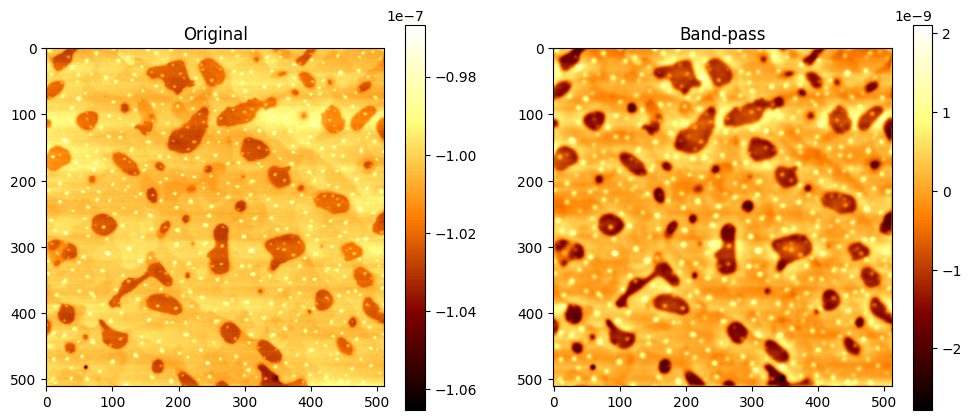

In [3]:
z_filtered = fft_bandpass(
    z,
    low_sigma=5,
    high_sigma=40
)


plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(z, cmap="afmhot")
plt.title("Original")
plt.colorbar()


plt.subplot(1,2,2)
plt.imshow(z_filtered, cmap="afmhot")
plt.title("Band-pass")
plt.colorbar()


plt.show()

## Gaussian of the Laplacian (LoG) blob detection 

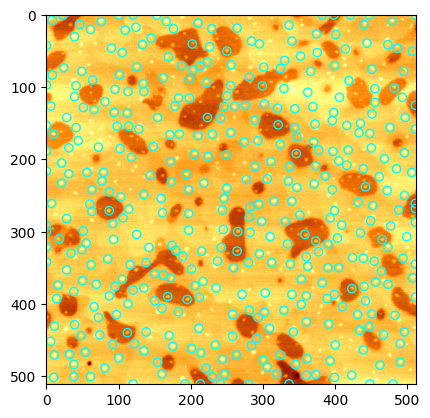

In [4]:
from skimage.feature import blob_log


from skimage.filters import gaussian, sobel, threshold_otsu
from skimage.morphology import remove_small_objects
import matplotlib.pyplot as plt

z_norm = (
    z_filtered - np.mean(z_filtered)
) / np.std(z_filtered)

z_norm = gaussian(z_norm, sigma=1)

blobs = blob_log(
    z_norm,
    min_sigma=2, # values are in pixels, so works just like imagej
    max_sigma=8,
    num_sigma=20,
    threshold=0.5
)

plt.imshow(z, cmap="afmhot")

plt.scatter(
    blobs[:,1],
    blobs[:,0],
    facecolors="none",
    edgecolors="cyan"
)

plt.show()

In [5]:
print(len(blobs))

396


## Thresholding - Calculating upper and lower Otsu thresholds

I have then read about **Otsu's** thresholding, and tried applying it for the blob_log in case there is an optimum threshold somewhere close to the one that we have here

Otsu chooses the division that maximises the separation between 2 statistical groups. with this skewed distribution it roughly separates the very large population of weak responses; the smaller long tail of stronger responses.

I think its like max-minimising the threshold in decisions probabilities..

Otsu threshold: 0.3742742285724291
Detected blobs: 489


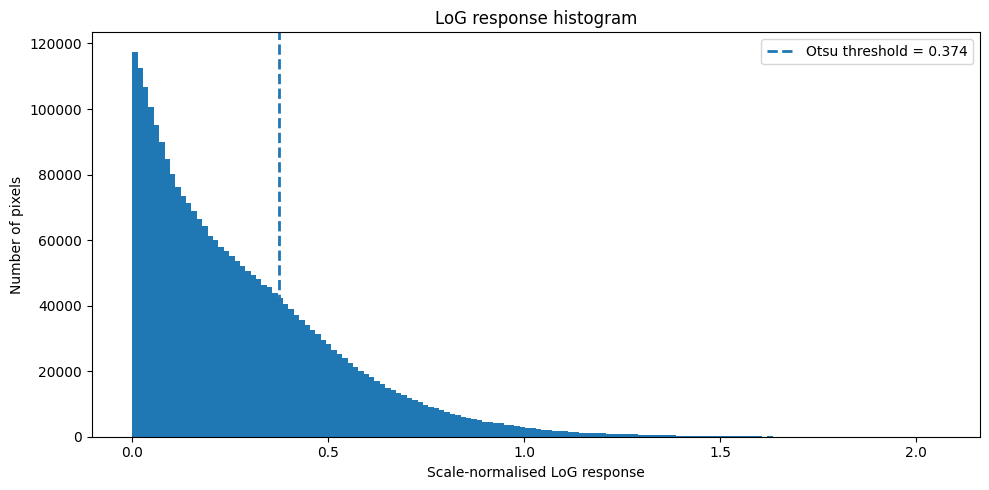

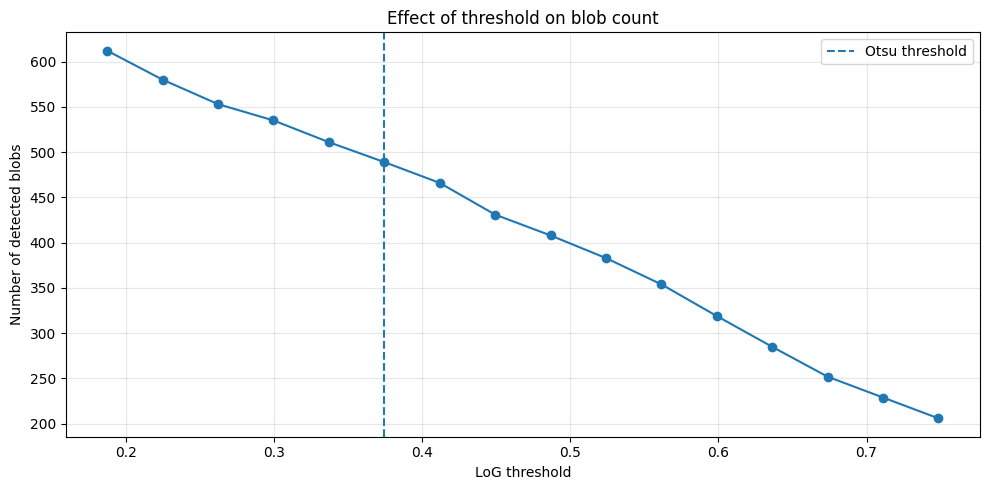

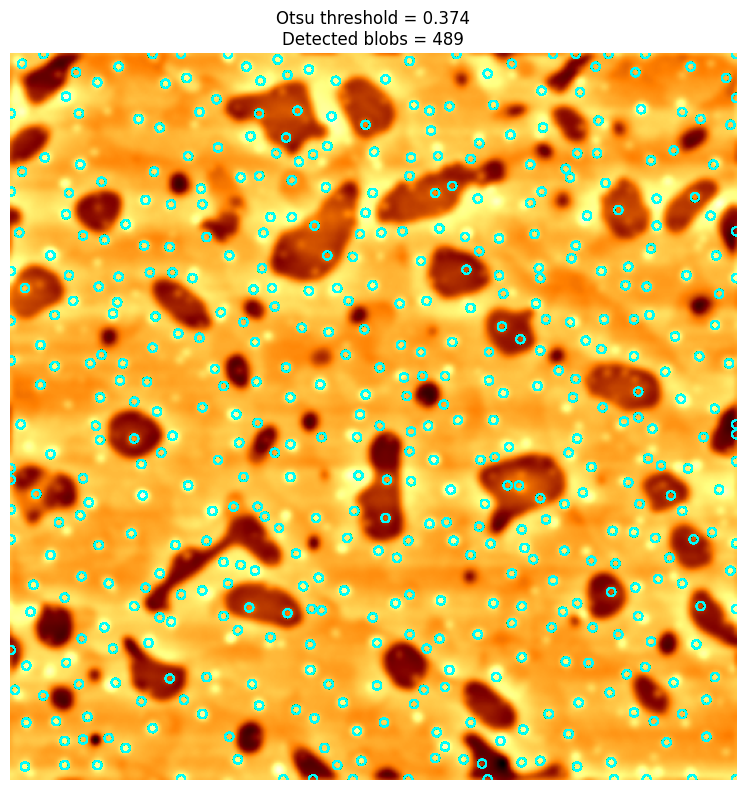

In [6]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.ndimage import gaussian_laplace
from skimage.feature import blob_log
from skimage.filters import threshold_otsu


# --------------------------------------------------
# 1. Build the LoG scale space
# --------------------------------------------------

min_sigma = 2
max_sigma = 8
num_sigma = 20

sigmas = np.linspace(
    min_sigma,
    max_sigma,
    num_sigma,
)

positive_responses = []

for sigma in sigmas:

    # Negative LoG gives positive responses for bright blobs
    response = -gaussian_laplace(
        z_norm,
        sigma=sigma,
    )

    # Scale normalisation
    response *= sigma**2

    positive_responses.append(
        response[response > 0]
    )


all_positive_responses = np.concatenate(
    positive_responses
)


# --------------------------------------------------
# 2. Calculate the Otsu threshold
# --------------------------------------------------

otsu_threshold = threshold_otsu(
    all_positive_responses
)

print("Otsu threshold:", otsu_threshold)


# --------------------------------------------------
# 3. Detect blobs using the Otsu threshold
# --------------------------------------------------

blobs = blob_log(
    z_norm,
    min_sigma=min_sigma,
    max_sigma=max_sigma,
    num_sigma=num_sigma,
    threshold=otsu_threshold,
    overlap=0.5,
)

print("Detected blobs:", len(blobs))


# --------------------------------------------------
# 4. Graph: histogram of LoG responses
# --------------------------------------------------

plt.figure(figsize=(10, 5))

plt.hist(
    all_positive_responses,
    bins=150,
)

plt.axvline(
    otsu_threshold,
    linestyle="--",
    linewidth=2,
    label=f"Otsu threshold = {otsu_threshold:.3f}",
)

plt.xlabel("Scale-normalised LoG response")
plt.ylabel("Number of pixels")
plt.title("LoG response histogram")
plt.legend()
plt.tight_layout()
plt.show()


# --------------------------------------------------
# 5. Graph: blob count for thresholds around Otsu
# --------------------------------------------------

factors = np.linspace(
    0.5,
    2.0,
    16,
)

thresholds = factors * otsu_threshold
blob_counts = []

for threshold in thresholds:

    test_blobs = blob_log(
        z_norm,
        min_sigma=min_sigma,
        max_sigma=max_sigma,
        num_sigma=num_sigma,
        threshold=threshold,
        overlap=0.5,
    )

    blob_counts.append(
        len(test_blobs)
    )


plt.figure(figsize=(10, 5))

plt.plot(
    thresholds,
    blob_counts,
    marker="o",
)

plt.axvline(
    otsu_threshold,
    linestyle="--",
    label="Otsu threshold",
)

plt.xlabel("LoG threshold")
plt.ylabel("Number of detected blobs")
plt.title("Effect of threshold on blob count")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# --------------------------------------------------
# 6. Graph: detected blobs
# --------------------------------------------------

plt.figure(figsize=(8, 8))

plt.imshow(
    z_norm,
    cmap="afmhot",
)

ax = plt.gca()

for y, x, sigma in blobs:

    radius = np.sqrt(2) * sigma

    plt.scatter(
    blobs[:,1],
    blobs[:,0],
    facecolors="none",
    edgecolors="cyan"
    )


plt.title(
    f"Otsu threshold = {otsu_threshold:.3f}\n"
    f"Detected blobs = {len(blobs)}"
)

plt.axis("off")
plt.tight_layout()
plt.show()

Restricted Otsu threshold: 0.6888598877711338


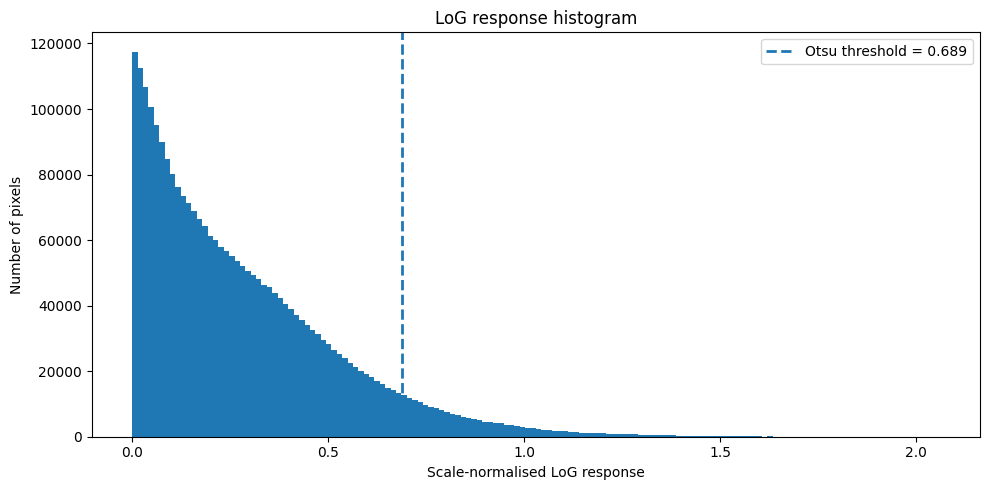

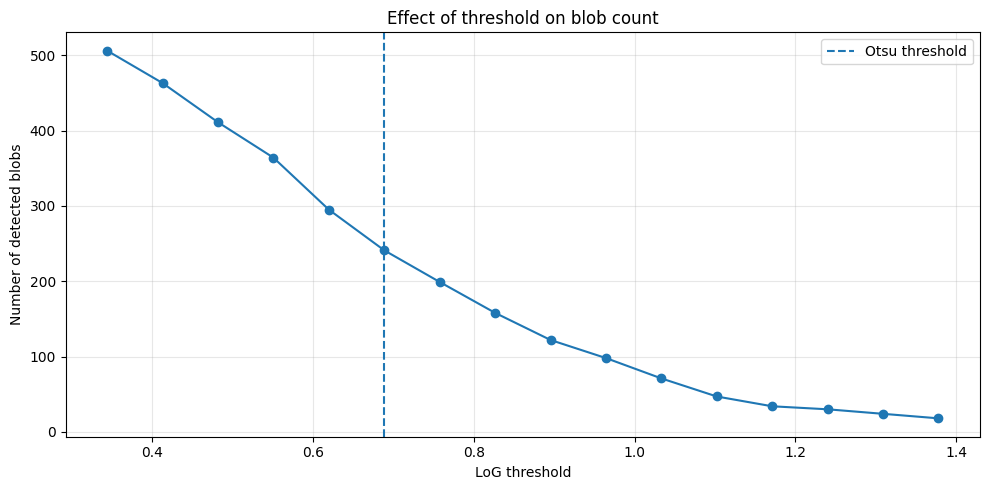

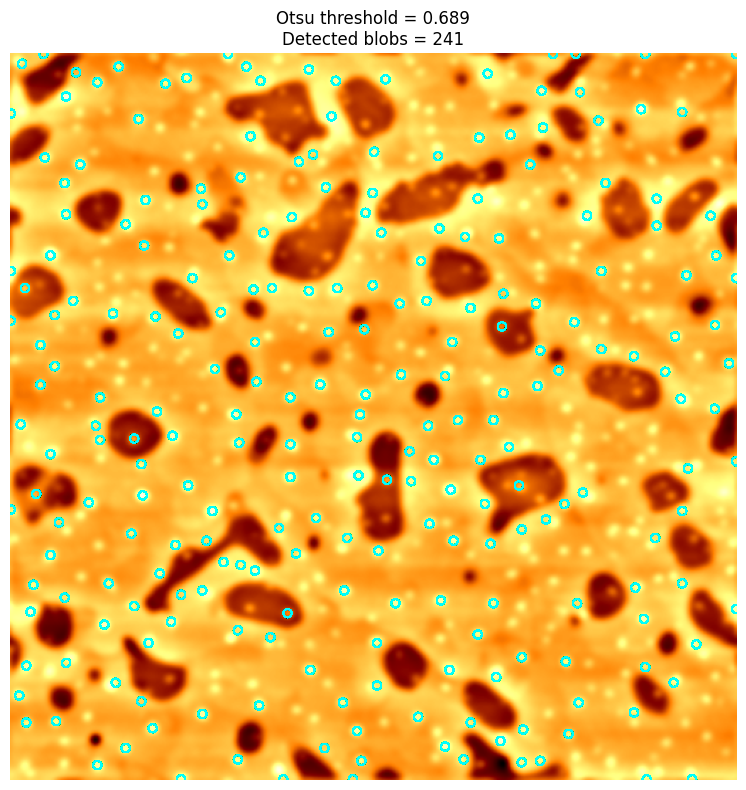

In [7]:
lower_cutoff = np.percentile(
    all_positive_responses,
    70,
)

stronger_responses = all_positive_responses[
    all_positive_responses >= lower_cutoff
]

otsu_threshold = threshold_otsu(
    stronger_responses
)

print("Restricted Otsu threshold:", otsu_threshold)

blobs = blob_log(
    z_norm,
    min_sigma=min_sigma,
    max_sigma=max_sigma,
    num_sigma=num_sigma,
    threshold=otsu_threshold,
    overlap=0.5,
)




# --------------------------------------------------
# 4. Graph: histogram of LoG responses
# --------------------------------------------------

plt.figure(figsize=(10, 5))

plt.hist(
    all_positive_responses,
    bins=150,
)

plt.axvline(
    otsu_threshold,
    linestyle="--",
    linewidth=2,
    label=f"Otsu threshold = {otsu_threshold:.3f}",
)

plt.xlabel("Scale-normalised LoG response")
plt.ylabel("Number of pixels")
plt.title("LoG response histogram")
plt.legend()
plt.tight_layout()
plt.show()


# --------------------------------------------------
# 5. Graph: blob count for thresholds around Otsu
# --------------------------------------------------

factors = np.linspace(
    0.5,
    2.0,
    16,
)

thresholds = factors * otsu_threshold
blob_counts = []

for threshold in thresholds:

    test_blobs = blob_log(
        z_norm,
        min_sigma=min_sigma,
        max_sigma=max_sigma,
        num_sigma=num_sigma,
        threshold=threshold,
        overlap=0.5,
    )

    blob_counts.append(
        len(test_blobs)
    )


plt.figure(figsize=(10, 5))

plt.plot(
    thresholds,
    blob_counts,
    marker="o",
)

plt.axvline(
    otsu_threshold,
    linestyle="--",
    label="Otsu threshold",
)

plt.xlabel("LoG threshold")
plt.ylabel("Number of detected blobs")
plt.title("Effect of threshold on blob count")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# --------------------------------------------------
# 6. Graph: detected blobs
# --------------------------------------------------

plt.figure(figsize=(8, 8))

plt.imshow(
    z_norm,
    cmap="afmhot",
)

ax = plt.gca()

for y, x, sigma in blobs:

    radius = np.sqrt(2) * sigma

    plt.scatter(
    blobs[:,1],
    blobs[:,0],
    facecolors="none",
    edgecolors="cyan"
    )


plt.title(
    f"Otsu threshold = {otsu_threshold:.3f}\n"
    f"Detected blobs = {len(blobs)}"
)

plt.axis("off")
plt.tight_layout()
plt.show()



Looks like the upper threshold gives very similar results to the log_blob plot, whereas the lower bound estimate is too small.
But this may be useful for having the bounds for qounting QDs? 

Also it was good to see that the Thresholds calculated mathematically are so similar to the ones that we have been using. Starting from 0.7 and moving down to 0.4 gives us very similar results to this plot.

## Background filtering

### Applying anisotropic diffusion to ensure that the boundaries between the dot and the rest of the .afm scan are visible

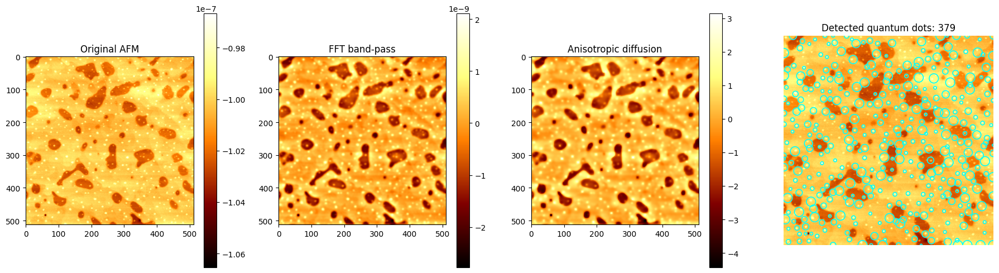

In [8]:
def anisotropic_diffusion(
    image: np.ndarray,
    n_iterations: int = 10,
    kappa: float = 0.3,
    gamma: float = 0.1,
    option: int = 1,
) -> np.ndarray:
    """
    Perona-Malik anisotropic diffusion.

    Parameters
    ----------
    image:
        2D image.

    n_iterations:
        Number of diffusion iterations.
        More iterations produce stronger smoothing.

    kappa:
        Edge sensitivity.
        Smaller values preserve more edges.
        Larger values smooth across more intensity differences.

    gamma:
        Diffusion step size.
        Keep gamma <= 0.25 for numerical stability.

    option:
        1: strongly preserves sharp edges
        2: smoother transition around edges
    """

    diffused = np.asarray(image, dtype=float).copy()

    for _ in range(n_iterations):

        # Differences between each pixel and its neighbours
        north = np.zeros_like(diffused)
        south = np.zeros_like(diffused)
        east = np.zeros_like(diffused)
        west = np.zeros_like(diffused)

        north[:-1, :] = diffused[1:, :] - diffused[:-1, :]
        south[1:, :] = diffused[:-1, :] - diffused[1:, :]
        east[:, :-1] = diffused[:, 1:] - diffused[:, :-1]
        west[:, 1:] = diffused[:, :-1] - diffused[:, 1:]

        if option == 1:
            # Strong edge preservation
            c_north = np.exp(-(north / kappa) ** 2)
            c_south = np.exp(-(south / kappa) ** 2)
            c_east = np.exp(-(east / kappa) ** 2)
            c_west = np.exp(-(west / kappa) ** 2)

        elif option == 2:
            # More gradual edge preservation
            c_north = 1 / (1 + (north / kappa) ** 2)
            c_south = 1 / (1 + (south / kappa) ** 2)
            c_east = 1 / (1 + (east / kappa) ** 2)
            c_west = 1 / (1 + (west / kappa) ** 2)

        else:
            raise ValueError("option must be 1 or 2")

        diffused += gamma * (
            c_north * north
            + c_south * south
            + c_east * east
            + c_west * west
        )

    return diffused



z_filtered = fft_bandpass(
    z,
    low_sigma=5,
    high_sigma=40,
)



z_standardised = (
    z_filtered - np.mean(z_filtered)
) / np.std(z_filtered)



z_diffused = anisotropic_diffusion(
    z_standardised,
    n_iterations=15,
    kappa=0.4,
    gamma=0.15,
    option=1,
)



blobs = blob_log(
    z_diffused,
    min_sigma=1,
    max_sigma=8,
    num_sigma=10,
    threshold=0.4,
)


# blob_log returns sigma, not radius
if len(blobs) > 0:
    blobs[:, 2] *= np.sqrt(2)


# --------------------------------------------------
# Display processing stages
# --------------------------------------------------

plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)
plt.imshow(z, cmap="afmhot")
plt.title("Original AFM")
plt.colorbar()

plt.subplot(1, 4, 2)
plt.imshow(z_filtered, cmap="afmhot")
plt.title("FFT band-pass")
plt.colorbar()

plt.subplot(1, 4, 3)
plt.imshow(z_diffused, cmap="afmhot")
plt.title("Anisotropic diffusion")
plt.colorbar()

plt.subplot(1, 4, 4)
plt.imshow(z, cmap="afmhot")

for y, x, radius in blobs:
    circle = plt.Circle(
        (x, y),
        radius,
        fill=False,
        edgecolor="cyan",
        linewidth=1.2,
    )
    plt.gca().add_patch(circle)

plt.title(f"Detected quantum dots: {len(blobs)}")
plt.axis("off")

plt.tight_layout()
plt.show()

Graphs looked suspiciously similar for the fft bandpass filtered and anisotropic diffusion cases, so I have decided to check difference between the images: 

In [9]:
difference = z_standardised - z_diffused

print("Mean absolute change:", np.mean(np.abs(difference)))
print("Maximum absolute change:", np.max(np.abs(difference)))
print(
    "Correlation:",
    np.corrcoef(
        z_standardised.ravel(),
        z_diffused.ravel(),
    )[0, 1],
)

Mean absolute change: 0.06522041901626291
Maximum absolute change: 0.5727873130697532
Correlation: 0.9961707063830949


Difference not too large, so looks like Gaussian smoothing is performing better in this case.

## Detecting Edges and verifying whether type of the edge we choose has an impact on dot detection

Applying an edge filter to ensure nothing is outside the edges of the QD and so that we see what python thinks is a dot


1. Sobel = default, estimates gradients with weighting the middle row/ colun more strongly so Sobel does some smoothing while finding edges. Used when you want a stable general-purpose edge map 

2. Scharr = sharper and more rotationally symmetric than Sobel but ofter better when you care about edge direction not being biased by pixel-grid orientation. Use when sobel looks slightly uneven or directional 

3. Prewitt = does less smoothing than Sobel, so can be more sensitive to noise 

4. Roberts = reacts to very local diagonal changes. Used when you want very fine local edges.

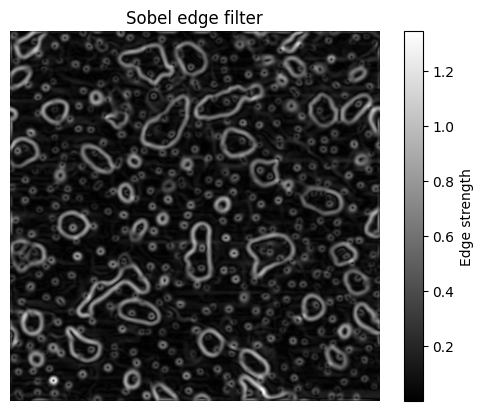

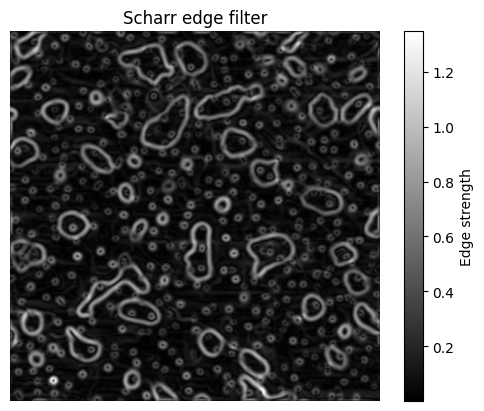

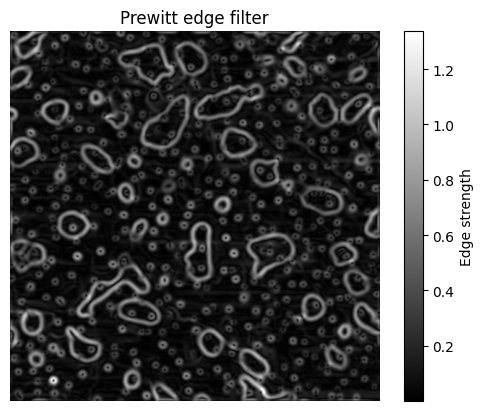

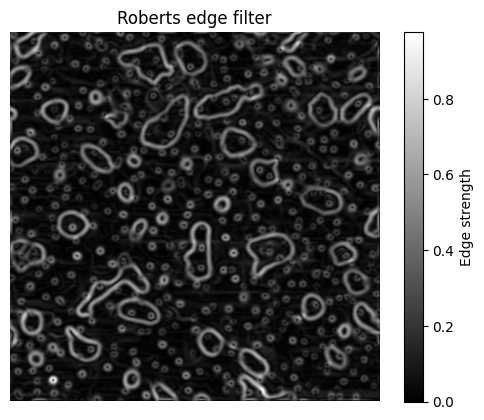

In [10]:
import matplotlib.pyplot as plt
from skimage import filters

sobel_edges = filters.sobel(z_norm)
scharr_edges = filters.scharr(z_norm)
prewitt_edges = filters.prewitt(z_norm)
roberts_edges = filters.roberts(z_norm)

plt.imshow(sobel_edges, cmap="gray")
plt.colorbar(label="Edge strength")
plt.title("Sobel edge filter")
plt.axis("off")
plt.show()

plt.imshow(scharr_edges, cmap="gray")
plt.colorbar(label="Edge strength")
plt.title("Scharr edge filter")
plt.axis("off")
plt.show()

plt.imshow(prewitt_edges, cmap="gray")
plt.colorbar(label="Edge strength")
plt.title("Prewitt edge filter")
plt.axis("off")
plt.show()

plt.imshow(roberts_edges, cmap="gray")
plt.colorbar(label="Edge strength")
plt.title("Roberts edge filter")
plt.axis("off")
plt.show()

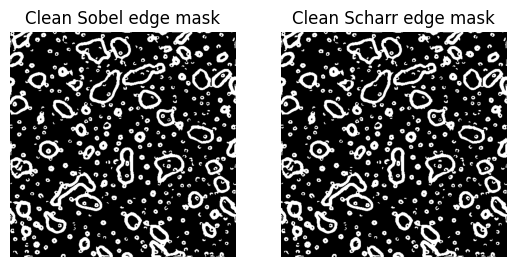

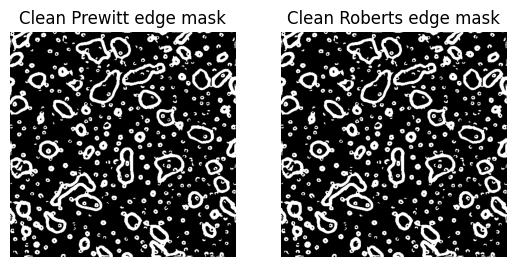

In [11]:
# 3. Threshold
threshold = threshold_otsu(sobel_edges)
edge_mask_sobel = sobel_edges > threshold

threshold = threshold_otsu(scharr_edges)
edge_mask_scharr = scharr_edges < threshold

threshold = threshold_otsu(prewitt_edges)
edge_mask_prewitt = prewitt_edges < threshold

threshold = threshold_otsu(roberts_edges)
edge_mask_roberts = roberts_edges < threshold

# 4. Clean tiny noise objects

edge_mask_clean_sobel = remove_small_objects(edge_mask_sobel, min_size=8)
edge_mask_clean_scharr = remove_small_objects(edge_mask_sobel, min_size=8)
edge_mask_clean_prewitt = remove_small_objects(edge_mask_sobel, min_size=8)
edge_mask_clean_roberts = remove_small_objects(edge_mask_sobel, min_size=8)

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(edge_mask_clean_sobel, cmap="gray")
ax1.set_title("Clean Sobel edge mask")
ax1.axis('off')

ax2.imshow(edge_mask_clean_scharr, cmap="gray")
ax2.set_title("Clean Scharr edge mask")
ax2.axis('off')

fig, (ax3, ax4) = plt.subplots(1, 2)

ax3.imshow(edge_mask_clean_prewitt, cmap="gray")
ax3.set_title("Clean Prewitt edge mask")
ax3.axis("off")

ax4.imshow(edge_mask_clean_roberts, cmap="gray")
ax4.set_title("Clean Roberts edge mask")
ax4.axis("off")


plt.show()

These all looked the same, so felt like subtracting them:

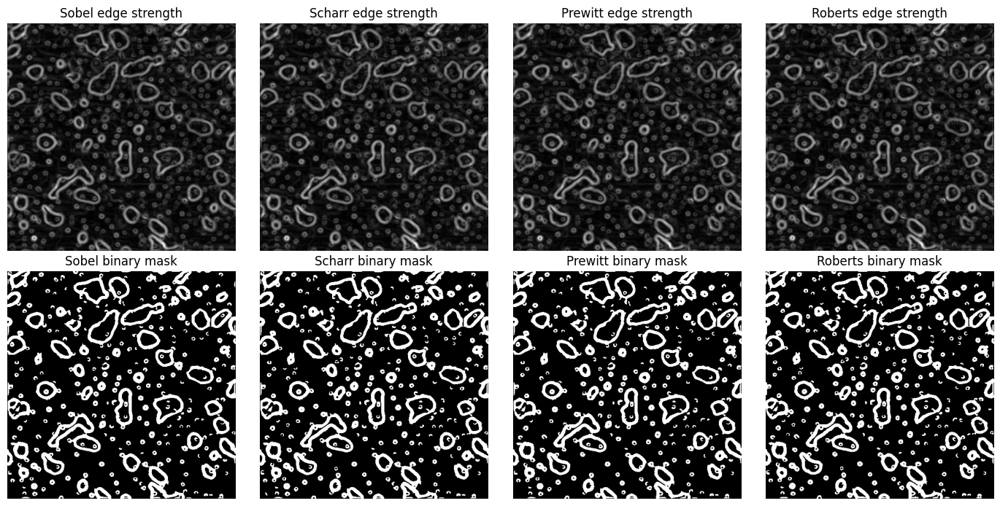

In [12]:
from skimage.filters import gaussian, sobel, scharr, prewitt, roberts
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects
import matplotlib.pyplot as plt

# topo = your AFM/topography array

topo_smooth = gaussian(z_norm, sigma=1, preserve_range=True)

edge_maps = {
    "Sobel": sobel(topo_smooth),
    "Scharr": scharr(topo_smooth),
    "Prewitt": prewitt(topo_smooth),
    "Roberts": roberts(topo_smooth),
}

fig, axes = plt.subplots(2, 4, figsize=(14, 7))

for i, (name, edges) in enumerate(edge_maps.items()):
    # continuous edge strength
    axes[0, i].imshow(edges, cmap="gray")
    axes[0, i].set_title(f"{name} edge strength")
    axes[0, i].axis("off")

    # binary mask
    threshold = threshold_otsu(edges)
    mask = edges > threshold
    mask = remove_small_objects(mask, min_size=20)

    axes[1, i].imshow(mask, cmap="gray")
    axes[1, i].set_title(f"{name} binary mask")
    axes[1, i].axis("off")

plt.tight_layout()
plt.show()

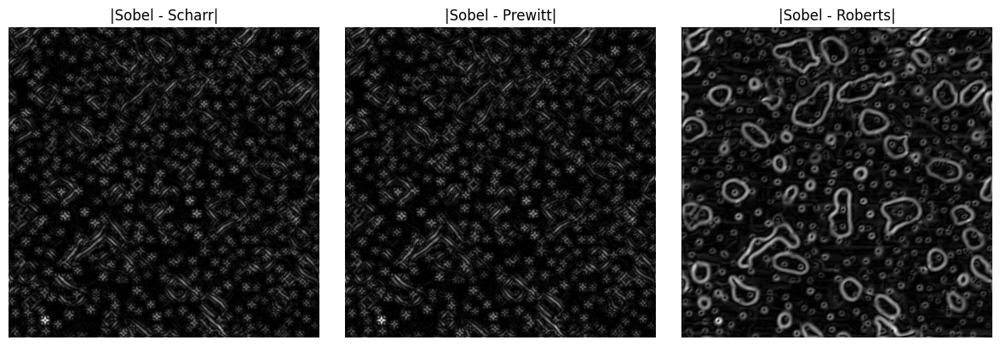

In [13]:
sobel_edges = edge_maps["Sobel"]
scharr_edges = edge_maps["Scharr"]
prewitt_edges = edge_maps["Prewitt"]
roberts_edges = edge_maps["Roberts"]

diff_sobel_scharr = abs(sobel_edges - scharr_edges)
diff_sobel_prewitt = abs(sobel_edges - prewitt_edges)
diff_sobel_roberts = abs(sobel_edges - roberts_edges)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(diff_sobel_scharr, cmap="gray")
axes[0].set_title("|Sobel - Scharr|")
axes[0].axis("off")

axes[1].imshow(diff_sobel_prewitt, cmap="gray")
axes[1].set_title("|Sobel - Prewitt|")
axes[1].axis("off")

axes[2].imshow(diff_sobel_roberts, cmap="gray")
axes[2].set_title("|Sobel - Roberts|")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [14]:
import numpy as np

for name, edges in edge_maps.items():
    diff = np.mean(np.abs(sobel_edges - edges))
    print(f"Mean absolute difference Sobel vs {name}: {diff:.6f}")

Mean absolute difference Sobel vs Sobel: 0.000000
Mean absolute difference Sobel vs Scharr: 0.000533
Mean absolute difference Sobel vs Prewitt: 0.000710
Mean absolute difference Sobel vs Roberts: 0.053573


![Top Hat filter choosing bounds](Screenshot%202026-07-08%20at%2013.06.12.png)

Using these boundaries to estimate the top hat transform boundaries. with the consideration that 1 pixel is approximately 2nm

Largest dot has diameter 25nm, so k=2*d+1=51

Image shape: (512, 512)
Image min/max: 0 255


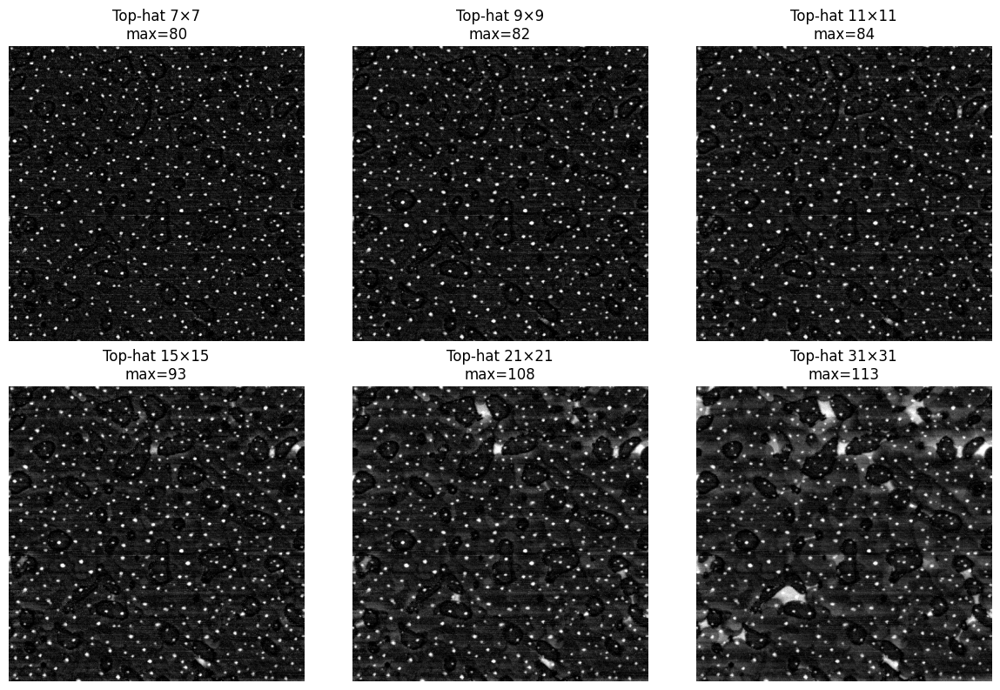

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

path = "2nm QD AFMs/AIX6461_along the flat edge_1um_200pN_15gain_2um zrange.0_00000_forimagej.png"

img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

if img is None:
    raise FileNotFoundError(f"Could not read image: {path}")

print("Image shape:", img.shape)
print("Image min/max:", img.min(), img.max())

kernel_sizes = [7, 9, 11, 15, 21, 31, 51]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for ax, k in zip(axes.ravel(), kernel_sizes): # the zip function pairs each plot with the kernel size. and these then get flattened so that we get one large plot with many subplots 
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (k, k))
    tophat = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

    # contrast stretch for display
    vmin = np.percentile(tophat, 1)
    vmax = np.percentile(tophat, 99.7)

    ax.imshow(tophat, cmap="gray", vmin=vmin, vmax=vmax)
    ax.set_title(f"Top-hat {k}×{k}\nmax={tophat.max()}")
    ax.axis("off")

plt.tight_layout()
plt.show()

**For each kernel size: <br>**
<br>
    1. create a circular kernel of that size <br>
    2. use it to remove smooth/ large background <br>
    3. strertch contrast so weak details are visible <br>
    4. show the result in the next subplot

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

from skimage.filters import gaussian
from skimage.feature import blob_log

kernel_sizes = [7, 9, 11, 15, 21, 31, 51]


z_float = z.astype(np.float32)

# Normalize to 0-255 because OpenCV morphology works nicely on uint8 images
z_255 = cv2.normalize(
    z_float,
    None,
    0,
    255,
    cv2.NORM_MINMAX
).astype(np.uint8)


tophat_results = {}
norm_results = {}
blob_results = {}


for k in kernel_sizes:
    # Make an elliptical structuring element of size k x k
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (k, k)
    )

    # Apply white top-hat filter
    z_tophat = cv2.morphologyEx(
        z_255,
        cv2.MORPH_TOPHAT,
        kernel
    )

    # Convert to float for skimage / numerical operations
    z_filtered = z_tophat.astype(np.float32)

    # Z-score normalization
    z_norm = (
        z_filtered - np.mean(z_filtered)
    ) / (np.std(z_filtered) + 1e-8)

    # Smooth before blob detection
    z_norm_smooth = gaussian(
        z_norm,
        sigma=1,
        preserve_range=True
    )

    # Detect blobs on the filtered/smoothed image
    blobs = blob_log(
        z_norm_smooth,
        min_sigma=2,
        max_sigma=10,
        num_sigma=20,
        threshold=0.8
    )

    # Convert sigma to approximate radius
    if len(blobs) > 0:
        blobs[:, 2] = blobs[:, 2] * np.sqrt(2)

    # Store everything
    tophat_results[k] = z_tophat
    norm_results[k] = z_norm_smooth
    blob_results[k] = blobs

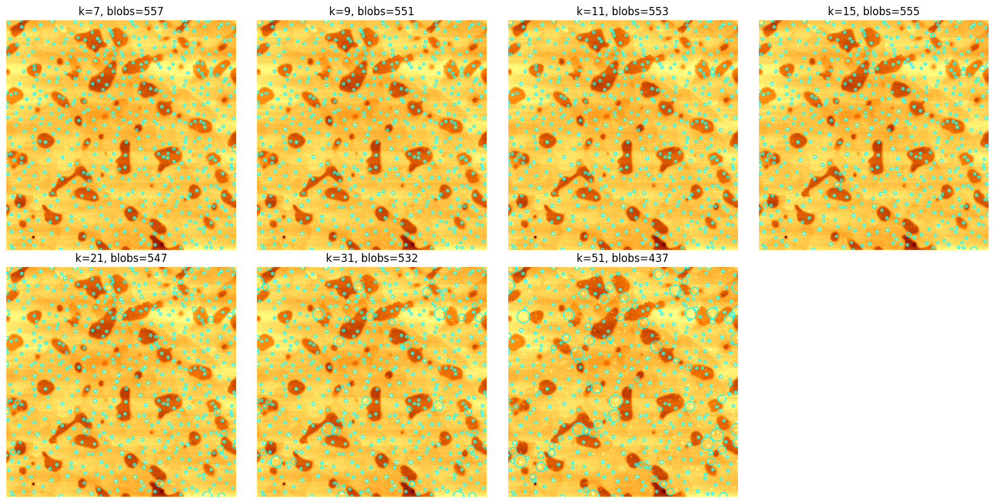

In [17]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for ax, k in zip(axes.ravel(), kernel_sizes):
    blobs = blob_results[k]

    ax.imshow(z, cmap="afmhot")

    for y, x, r in blobs:
        circle = plt.Circle(
            (x, y),
            r,
            color="cyan",
            fill=False,
            linewidth=1
        )
        ax.add_patch(circle)

    ax.set_title(f"k={k}, blobs={len(blobs)}")
    ax.axis("off")

# Hide unused 8th subplot
for ax in axes.ravel()[len(kernel_sizes):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

Then, I tried to look at a different image so that we ensure that this choise isnt overfitting to this speific AFM scan.

## Feature detection 

We looked at the LoG at the start of the notebook (and it is still the best method I found), but before testing these, I didn't yet know about this. So, here are some more methods of feature detection.

### Phase Congruency

The main idea is that an edge or line appear where several waves of different sizes reach a peak, through, or 0 at the same position. And this can be deternined by convolving a set of wavelet filters with an image and calculating the difference between the average filter response.

An Analogy could be that in an orchestra, if all instruments play their notes at the same moment, you perceive a sharp accent (an edge). If they drift in time (phase), the sound becomes blurred. Phase congruency finds moments where all the 'instrucments' (frequnecies) are synchronised.

I may have been a bit biased with using this method, since it uses Gabor wavelets that I got very interested in...

Image shape: (512, 512)
Detected QDs: 626
Phase noise threshold: 0.015876935720208638


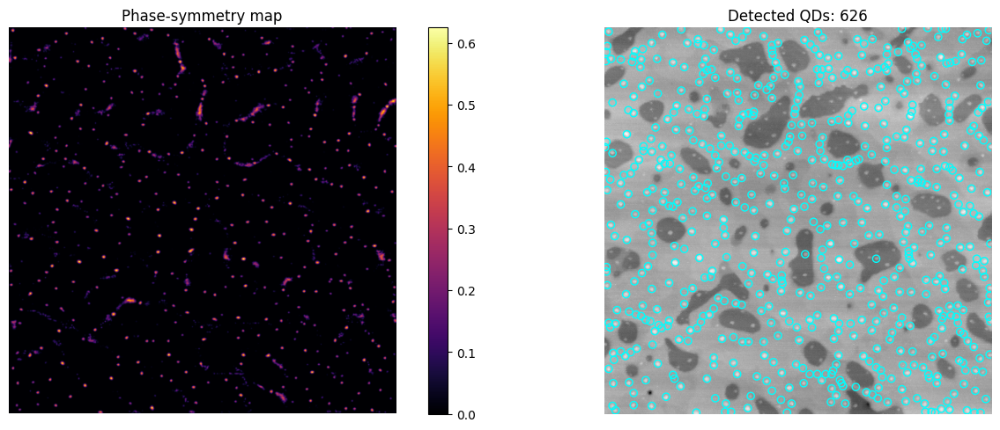

Peaks before height filtering: 676
Candidate height range: 0.01692164121566393 0.28475894673132457
Phase candidates: 676
QDs at least 6 Å high: 497
Minimum accepted height: 6.022399999999915e-10
Median accepted height: 1.8161289999999993e-09
Maximum accepted height: 3.304731999999996e-09


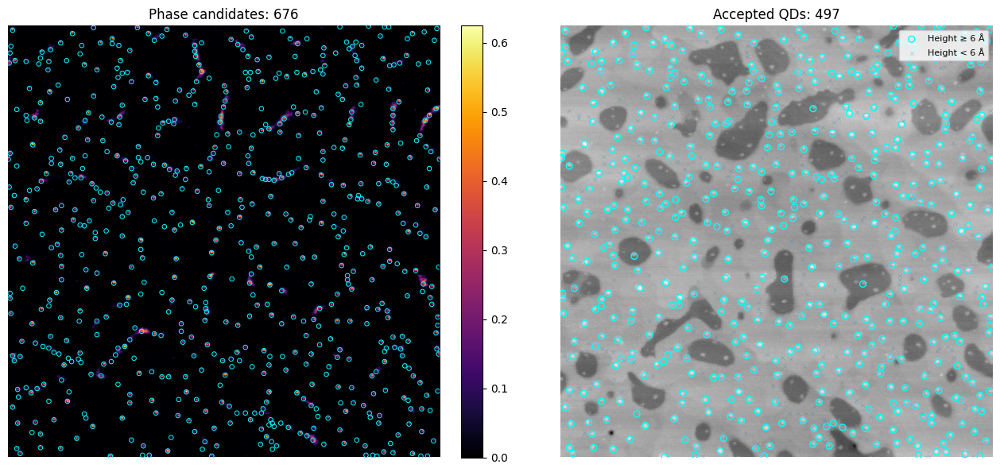

In [35]:
from skimage.feature import peak_local_max

# Standardize the height values.
z_std = np.std(z_nobackground)
z_norm = z_nobackground / z_std

# Background scale must be larger than the QDs.
local_background = gaussian_filter(z, sigma=12)
# Positive values now mean raised relative to the local surface, including inside large dark defects.
z_local = z - local_background

def filter_by_local_height(
    candidate_centres,
    z_physical,
    minimum_height,
    search_radius=2,
    background_inner_radius=5,
    background_outer_radius=10,
):
    """
    Measure each candidate relative to its local background.

    Returns
    -------
    accepted_centres : [y, x] coordinates of accepted QDs
    accepted_heights : measured local heights
    rejected_centres : candidates below the height threshold
    rejected_heights : their measured local heights
    """

    rows, cols = z_physical.shape

    accepted_centres = []
    accepted_heights = []
    rejected_centres = []
    rejected_heights = []

    for candidate_y, candidate_x in candidate_centres:

        # Find the actual dot apex close to the phase peak.
        y0 = max(0, candidate_y - search_radius)
        y1 = min(rows, candidate_y + search_radius + 1)
        x0 = max(0, candidate_x - search_radius)
        x1 = min(cols, candidate_x + search_radius + 1)

        search_patch = z_physical[y0:y1, x0:x1]

        local_y, local_x = np.unravel_index(
            np.nanargmax(search_patch),
            search_patch.shape,
        )

        peak_y = y0 + local_y
        peak_x = x0 + local_x
        peak_value = z_physical[peak_y, peak_x]

        # Create a ring around the candidate to estimate its background.
        by0 = max(0, peak_y - background_outer_radius)
        by1 = min(rows, peak_y + background_outer_radius + 1)
        bx0 = max(0, peak_x - background_outer_radius)
        bx1 = min(cols, peak_x + background_outer_radius + 1)

        background_patch = z_physical[by0:by1, bx0:bx1]

        yy, xx = np.ogrid[by0:by1, bx0:bx1]

        distance_squared = (
            (yy - peak_y) ** 2
            + (xx - peak_x) ** 2
        )

        ring_mask = (
            (distance_squared >= background_inner_radius**2)
            & (distance_squared <= background_outer_radius**2)
        )

        background_values = background_patch[ring_mask]
        background_values = background_values[
            np.isfinite(background_values)
        ]

        if background_values.size < 10:
            continue

        local_background = np.median(background_values)

        dot_height = peak_value - local_background

        if dot_height >= minimum_height:
            accepted_centres.append((peak_y, peak_x))
            accepted_heights.append(dot_height)
        else:
            rejected_centres.append((peak_y, peak_x))
            rejected_heights.append(dot_height)

    accepted_centres = np.asarray(
        accepted_centres,
        dtype=int,
    ).reshape(-1, 2)

    accepted_heights = np.asarray(
        accepted_heights,
        dtype=float,
    )

    rejected_centres = np.asarray(
        rejected_centres,
        dtype=int,
    ).reshape(-1, 2)

    rejected_heights = np.asarray(
        rejected_heights,
        dtype=float,
    )

    # Remove duplicate apex locations.
    if len(accepted_centres):
        accepted_centres, indices = np.unique(
            accepted_centres,
            axis=0,
            return_index=True,
        )
        accepted_heights = accepted_heights[indices]

    return (
        accepted_centres,
        accepted_heights,
        rejected_centres,
        rejected_heights,
    )


# Robust standardisation.
median = np.median(z_local)
mad = np.median(np.abs(z_local - median))
robust_std = 1.4826 * mad

z_local_norm = (z_local - median) / (robust_std + 1e-8)

# ------------------------------------------------------------
# 2. Monogenic phase-symmetry detector
# ------------------------------------------------------------

def phase_symmetry_mono(
    image,
    nscale=4,
    min_wavelength=1.5,
    mult=6.0,
    sigma_on_f=0.55,
    noise_k=2.5,
    polarity=1,
):
    """
    Calculate a monogenic phase-symmetry map = image where each pixel is assigned a score indicating how strongly the local structure looks like a symmetric bright or dark feature.

    Parameters
    ----------
    image : 2D ndarray. Standardized AFM height image.

    nscale : int = Number of log-Gabor scales.

    min_wavelength : float = Wavelength of the smallest filter in pixels.

    mult : float. Scale multiplication factor.

    sigma_on_f : float = Log-Gabor bandwidth parameter.

    noise_k : float = Noise rejection strength.

    polarity : {-1, 0, 1}
        1  detects bright symmetric features.
       -1  detects dark symmetric features.
        0  detects both.

    Returns
    -------
    phase_symmetry : 2D ndarray
        Normalized phase-symmetry response.

    total_energy : 2D ndarray
        Unnormalized phase-symmetry energy.

    noise_threshold : float
        Estimated noise threshold.
    """

    image = np.asarray(image, dtype=np.float64)

    rows, cols = image.shape
    epsilon = np.finfo(np.float64).eps

    image_fft = np.fft.fft2(image)

    # Frequency coordinates.
    fx = np.fft.fftfreq(cols)
    fy = np.fft.fftfreq(rows)
    u, v = np.meshgrid(fx, fy)

    radius = np.sqrt(u**2 + v**2)
    radius[0, 0] = 1.0

    # Riesz transform filters used for the monogenic signal.
    riesz_x = 1j * u / radius
    riesz_y = 1j * v / radius

    # Suppress frequencies near the corners of the Fourier plane.
    cutoff = 0.45
    lowpass_order = 10

    lowpass = 1.0 / (
        1.0 + (radius / cutoff) ** (2 * lowpass_order)
    )

    total_energy = np.zeros_like(image)
    sum_amplitude = np.zeros_like(image)

    smallest_scale_amplitude = None

    log_gabor_denominator = 2.0 * np.log(sigma_on_f) ** 2

    for scale in range(nscale):

        wavelength = min_wavelength * mult**scale
        centre_frequency = 1.0 / wavelength

        log_radius = np.log(radius / centre_frequency)

        log_gabor = np.exp(
            -(log_radius**2) / log_gabor_denominator
        )

        log_gabor *= lowpass
        log_gabor[0, 0] = 0.0

        filtered_fft = image_fft * log_gabor

        # Even-symmetric filter response.
        even_response = np.real(
            np.fft.ifft2(filtered_fft)
        )

        # Odd-symmetric Riesz responses.
        odd_x = np.real(
            np.fft.ifft2(filtered_fft * riesz_x)
        )

        odd_y = np.real(
            np.fft.ifft2(filtered_fft * riesz_y)
        )

        odd_amplitude = np.sqrt(
            odd_x**2 + odd_y**2
        )

        amplitude = np.sqrt(
            even_response**2 + odd_amplitude**2
        )

        sum_amplitude += amplitude

        if polarity == 1:
            # Bright symmetric structures such as raised QDs.
            scale_energy = even_response - odd_amplitude

        elif polarity == -1:
            # Dark symmetric structures such as pits.
            scale_energy = -even_response - odd_amplitude

        elif polarity == 0:
            # Both bright and dark symmetric structures.
            scale_energy = (
                np.abs(even_response) - odd_amplitude
            )

        else:
            raise ValueError(
                "polarity must be -1, 0 or 1"
            )

        total_energy += scale_energy

        if scale == 0:
            smallest_scale_amplitude = amplitude.copy()

    # Estimate noise from the smallest-scale response.
    tau = (
        np.median(smallest_scale_amplitude)
        / np.sqrt(np.log(4.0))
    )

    # Sum the expected noise over all scales.
    if np.isclose(mult, 1.0):
        total_tau = tau * nscale
    else:
        total_tau = (
            tau
            * (1.0 - (1.0 / mult) ** nscale)
            / (1.0 - 1.0 / mult)
        )

    noise_mean = total_tau * np.sqrt(np.pi / 2.0)

    noise_std = total_tau * np.sqrt(
        (4.0 - np.pi) / 2.0
    )

    noise_threshold = (
        noise_mean + noise_k * noise_std
    )

    phase_symmetry = np.maximum(
        total_energy - noise_threshold,
        0.0,
    )

    phase_symmetry /= sum_amplitude + epsilon

    return phase_symmetry, total_energy, noise_threshold


# ------------------------------------------------------------
# 3. Detect QD centres
# ------------------------------------------------------------

def detect_qds_phase_symmetry(
    z_norm,
    nscale=4,
    min_wavelength=1.5,
    mult=6.0,
    noise_k=2.5,
    symmetry_threshold=0.20,
    minimum_height=0.06,
    min_distance=2,
):
    """
    Detect bright quantum-dot centres.

    Returns
    -------
    centres : ndarray, shape (N, 2)
        Detected coordinates in [row, column] or [y, x] order.

    phase_map : 2D ndarray
        Phase-symmetry response used for detection.

    noise_threshold : float
        Estimated phase noise threshold.
    """

    phase_map, total_energy, noise_threshold = (
        phase_symmetry_mono(
            z_norm,
            nscale=nscale,
            min_wavelength=min_wavelength,
            mult=mult,
            sigma_on_f=0.55,
            noise_k=noise_k,
            polarity=1,
        )
    )

    # Remove very small fluctuations in the symmetry map.
    phase_map = gaussian_filter(
        phase_map,
        sigma=0.7,
    )

    centres = peak_local_max(
        phase_map,
        min_distance=min_distance,
        threshold_abs=symmetry_threshold,
        exclude_border=False,
    )

    # Phase symmetry can detect low-contrast symmetric noise.
    # Retain only candidates located on raised regions.
    if centres.size > 0:

        rows = centres[:, 0]
        cols = centres[:, 1]

        keep = (
            z_norm[rows, cols] >= minimum_height
        )

        centres = centres[keep]

    return centres, phase_map, noise_threshold


centres, phase_map, phase_noise_threshold = (
    detect_qds_phase_symmetry(
        z_local_norm,
        nscale=4,
        min_wavelength=1.5,
        mult=6.0,
        noise_k=2.5,
        symmetry_threshold=0.10,
        minimum_height=6e-10,
        min_distance=3,
    )
)

print("Image shape:", z.shape)
print("Detected QDs:", len(centres))
print(
    "Phase noise threshold:",
    phase_noise_threshold,
)


# ------------------------------------------------------------
# 4. Display the results
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(18, 5),
)


phase_display = axes[0].imshow(
    phase_map,
    cmap="inferno",
)
axes[0].set_title("Phase-symmetry map")

plt.colorbar(
    phase_display,
    ax=axes[0],
    fraction=0.046,
    pad=0.04,
)

axes[1].imshow(
    z,
    cmap="gray",
)

if centres.size > 0:
    axes[1].scatter(
        centres[:, 1],
        centres[:, 0],
        s=35,
        facecolors="none",
        edgecolors="cyan",
        linewidths=1.0,
    )

axes[1].set_title(
    f"Detected QDs: {len(centres)}"
)

for axis in axes:
    axis.set_axis_off()

plt.tight_layout()
plt.show()


raw_centres = peak_local_max(
    phase_map,
    min_distance=3,
    threshold_abs=0.08,
    exclude_border=False,
)

print("Peaks before height filtering:", len(raw_centres))

if len(raw_centres):
    candidate_heights = z_local_norm[
        raw_centres[:, 0],
        raw_centres[:, 1],
    ]

    print(
        "Candidate height range:",
        candidate_heights.min(),
        candidate_heights.max(),
    )

(
    centres,
    qd_heights,
    rejected_centres,
    rejected_heights,
) = filter_by_local_height(
    candidate_centres=raw_centres,
    z_physical=z,
    minimum_height=6e-10,  # correct only when z is in metres
    search_radius=2,
    background_inner_radius=5,
    background_outer_radius=10,
)

print("Phase candidates:", len(raw_centres))
print("QDs at least 6 Å high:", len(centres))

if len(qd_heights):
    print("Minimum accepted height:", qd_heights.min())
    print("Median accepted height:", np.median(qd_heights))
    print("Maximum accepted height:", qd_heights.max())


# ------------------------------------------------------------
# Plot the results
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 6),
)

# Phase-symmetry candidates
phase_display = axes[0].imshow(
    phase_map,
    cmap="inferno",
)

if len(raw_centres):
    axes[0].scatter(
        raw_centres[:, 1],
        raw_centres[:, 0],
        s=16,
        facecolors="none",
        edgecolors="cyan",
        linewidths=0.7,
    )

axes[0].set_title(
    f"Phase candidates: {len(raw_centres)}"
)

plt.colorbar(
    phase_display,
    ax=axes[0],
    fraction=0.046,
    pad=0.04,
)


# QDs that pass the local 6 Å condition
axes[1].imshow(
    z,
    cmap="gray",
)

if len(centres):
    axes[1].scatter(
        centres[:, 1],
        centres[:, 0],
        s=32,
        facecolors="none",
        edgecolors="cyan",
        linewidths=1.0,
        label="Height ≥ 6 Å",
    )

# Optional: show rejected phase candidates as small crosses.
if len(rejected_centres):
    axes[1].scatter(
        rejected_centres[:, 1],
        rejected_centres[:, 0],
        s=10,
        marker="x",
        linewidths=0.5,
        alpha=0.35,
        label="Height < 6 Å",
    )

axes[1].set_title(
    f"Accepted QDs: {len(centres)}"
)

axes[1].legend(
    loc="upper right",
    fontsize=8,
)

for axis in axes:
    axis.set_axis_off()

plt.tight_layout()
plt.show()

## SIFT - Scale Invariance feature transform 

This one finds distinctive points in an image and describes the local pattern around each point so that the same feature can be recognised in another image.

1. Feature exctraction 
2. Description to select salient features 

All QD-scale SIFT candidates: 4397
Accepted QDs at least 6 Å high: 833
QD descriptor array: (833, 128)
Large-scale defect SIFT keypoints: 385
Defect descriptor array: (385, 128)
QD height range: 6.010774999999965e-10 to 3.304731999999996e-09 m


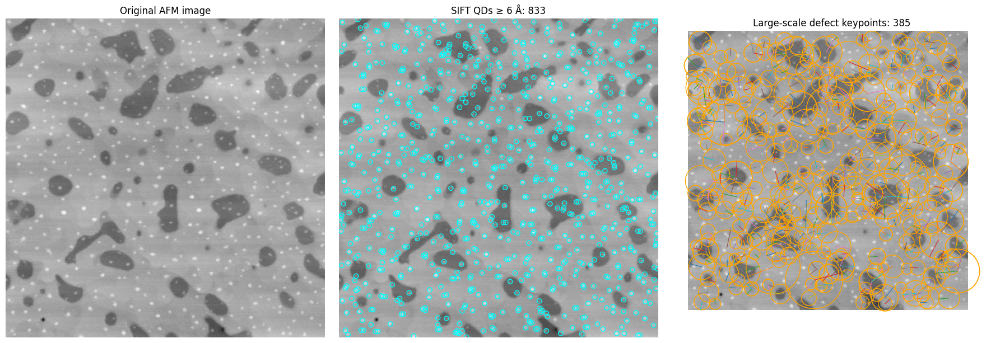

In [36]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.patches import Circle
from scipy.ndimage import gaussian_filter
from skimage.feature import SIFT


# ============================================================
# 1. Configuration
# ============================================================

# Specify the physical units stored in the original z array.
Z_UNIT = "m"          # Choose: "m", "nm", or "angstrom"

minimum_qd_height = {
    "m": 6e-10,       # 6 Å in metres
    "nm": 0.6,        # 6 Å in nanometres
    "angstrom": 6.0,  # 6 Å
}[Z_UNIT]


# SIFT scale limits in pixels.
#
# These are starting values and may require adjustment based on
# the physical pixel size of your AFM scan.
QD_MIN_SIGMA = 0.8
QD_MAX_SIGMA = 4.0

DEFECT_MIN_SIGMA = 4.0


# ============================================================
# 2. Basic utilities
# ============================================================

def robust_rescale(image, lower_percentile=1, upper_percentile=99):
    """
    Rescale an image into [0, 1] using robust percentiles.
    """

    image = np.asarray(image, dtype=np.float64)

    finite_values = image[np.isfinite(image)]

    if finite_values.size == 0:
        raise ValueError("The image contains no finite values.")

    low, high = np.percentile(
        finite_values,
        [lower_percentile, upper_percentile],
    )

    if high <= low:
        raise ValueError(
            "The image has insufficient intensity variation."
        )

    result = (image - low) / (high - low)

    return np.clip(result, 0, 1).astype(np.float32)


def run_sift(image, **sift_parameters):
    """
    Run SIFT safely and return empty arrays when no features exist.
    """

    detector = SIFT(**sift_parameters)

    try:
        detector.detect_and_extract(image)

    except RuntimeError:
        return (
            detector,
            np.empty((0, 2), dtype=float),
            np.empty(0, dtype=float),
            np.empty(0, dtype=float),
            np.empty((0, 128), dtype=np.uint8),
        )

    return (
        detector,
        detector.positions,
        detector.sigmas,
        detector.orientations,
        detector.descriptors,
    )


# ============================================================
# 3. Measure QD height relative to local background
# ============================================================

def filter_qds_by_local_height(
    candidate_points,
    z_physical,
    minimum_height,
    search_radius=2,
    background_inner_radius=5,
    background_outer_radius=10,
    minimum_separation=3,
):
    """
    Relocate each SIFT candidate to the nearby height maximum,
    measure its height relative to a local background ring,
    apply the 6 Å requirement, and suppress duplicates.

    Returns
    -------
    centres : ndarray, shape (N, 2)
        Accepted QD apex coordinates in [y, x] order.

    heights : ndarray, shape (N,)
        Locally measured QD heights in the units of z_physical.

    source_indices : ndarray, shape (N,)
        Indices connecting accepted QDs to the supplied SIFT
        candidate array and descriptors.
    """

    z_physical = np.asarray(z_physical, dtype=np.float64)

    rows, columns = z_physical.shape
    measured_candidates = []

    for candidate_index, point in enumerate(candidate_points):

        candidate_y = int(round(point[0]))
        candidate_x = int(round(point[1]))

        # Locate the actual AFM apex near the SIFT keypoint.
        y0 = max(0, candidate_y - search_radius)
        y1 = min(rows, candidate_y + search_radius + 1)

        x0 = max(0, candidate_x - search_radius)
        x1 = min(columns, candidate_x + search_radius + 1)

        search_patch = z_physical[y0:y1, x0:x1]

        if (
            search_patch.size == 0
            or not np.any(np.isfinite(search_patch))
        ):
            continue

        patch_y, patch_x = np.unravel_index(
            np.nanargmax(search_patch),
            search_patch.shape,
        )

        peak_y = y0 + patch_y
        peak_x = x0 + patch_x
        peak_value = z_physical[peak_y, peak_x]

        # Extract the local background region.
        by0 = max(0, peak_y - background_outer_radius)
        by1 = min(rows, peak_y + background_outer_radius + 1)

        bx0 = max(0, peak_x - background_outer_radius)
        bx1 = min(
            columns,
            peak_x + background_outer_radius + 1,
        )

        background_patch = z_physical[by0:by1, bx0:bx1]

        yy, xx = np.ogrid[by0:by1, bx0:bx1]

        distance_squared = (
            (yy - peak_y) ** 2
            + (xx - peak_x) ** 2
        )

        ring_mask = (
            (
                distance_squared
                >= background_inner_radius**2
            )
            & (
                distance_squared
                <= background_outer_radius**2
            )
            & np.isfinite(background_patch)
        )

        if np.count_nonzero(ring_mask) < 10:
            continue

        local_background = np.median(
            background_patch[ring_mask]
        )

        local_height = peak_value - local_background

        if local_height >= minimum_height:
            measured_candidates.append(
                (
                    peak_y,
                    peak_x,
                    local_height,
                    candidate_index,
                )
            )

    if not measured_candidates:
        return (
            np.empty((0, 2), dtype=int),
            np.empty(0, dtype=float),
            np.empty(0, dtype=int),
        )

    # Highest candidates are considered first.
    measured_candidates.sort(
        key=lambda item: item[2],
        reverse=True,
    )

    # Remove multiple SIFT keypoints belonging to the same QD.
    accepted = []

    for peak_y, peak_x, height, source_index in measured_candidates:

        sufficiently_far = all(
            (
                (peak_y - accepted_y) ** 2
                + (peak_x - accepted_x) ** 2
            )
            >= minimum_separation**2
            for (
                accepted_y,
                accepted_x,
                _,
                _,
            ) in accepted
        )

        if sufficiently_far:
            accepted.append(
                (
                    peak_y,
                    peak_x,
                    height,
                    source_index,
                )
            )

    centres = np.asarray(
        [(y, x) for y, x, _, _ in accepted],
        dtype=int,
    )

    heights = np.asarray(
        [height for _, _, height, _ in accepted],
        dtype=float,
    )

    source_indices = np.asarray(
        [index for _, _, _, index in accepted],
        dtype=int,
    )

    return centres, heights, source_indices


# ============================================================
# 4. Prepare the AFM image
# ============================================================

z_clean = np.asarray(z, dtype=np.float64)

if z_clean.ndim != 2:
    raise ValueError(
        f"Expected a 2D AFM image, received {z_clean.shape}"
    )

if not np.all(np.isfinite(z_clean)):
    replacement = np.nanmedian(z_clean)

    z_clean = np.nan_to_num(
        z_clean,
        nan=replacement,
        posinf=replacement,
        neginf=replacement,
    )


# ============================================================
# 5. QD-focused SIFT image
# ============================================================

# Sigma 12 should be larger than the QD radius.
local_background = gaussian_filter(
    z_clean,
    sigma=12,
)

# Small raised structures become positive.
qd_signal = z_clean - local_background

qd_image = robust_rescale(qd_signal)


# ============================================================
# 6. Defect-focused SIFT image
# ============================================================

# Difference between broad and moderately smoothed images.
# Dark depressions become positive in this image.
defect_signal = (
    gaussian_filter(z_clean, sigma=25)
    - gaussian_filter(z_clean, sigma=2)
)

defect_image = robust_rescale(defect_signal)


# ============================================================
# 7. Run small-scale SIFT for QDs
# ============================================================

(
    qd_sift,
    qd_positions_all,
    qd_sigmas_all,
    qd_orientations_all,
    qd_descriptors_all,
) = run_sift(
    qd_image,
    upsampling=2,
    n_octaves=4,
    n_scales=5,
    sigma_min=1.6,
    sigma_in=0.5,
    c_dog=0.005,
    c_edge=20,
)


qd_scale_mask = (
    (qd_sigmas_all >= QD_MIN_SIGMA)
    & (qd_sigmas_all <= QD_MAX_SIGMA)
)

qd_candidates = qd_positions_all[qd_scale_mask]

qd_candidate_sigmas = qd_sigmas_all[qd_scale_mask]

qd_candidate_orientations = (
    qd_orientations_all[qd_scale_mask]
)

qd_candidate_descriptors = (
    qd_descriptors_all[qd_scale_mask]
)


# Apply the local 6 Å height condition.
(
    qd_centres,
    qd_heights,
    qd_source_indices,
) = filter_qds_by_local_height(
    candidate_points=qd_candidates,
    z_physical=z_clean,
    minimum_height=minimum_qd_height,
    search_radius=2,
    background_inner_radius=5,
    background_outer_radius=10,
    minimum_separation=3,
)


# Descriptors corresponding to the accepted QDs.
if len(qd_source_indices):
    qd_descriptors = qd_candidate_descriptors[
        qd_source_indices
    ]
else:
    qd_descriptors = np.empty(
        (0, 128),
        dtype=qd_candidate_descriptors.dtype,
    )


# ============================================================
# 8. Run large-scale SIFT for defects
# ============================================================

(
    defect_sift,
    defect_positions_all,
    defect_sigmas_all,
    defect_orientations_all,
    defect_descriptors_all,
) = run_sift(
    defect_image,
    upsampling=1,
    n_octaves=6,
    n_scales=3,
    sigma_min=1.6,
    sigma_in=0.5,
    c_dog=0.01,
    c_edge=20,
)


defect_scale_mask = (
    defect_sigmas_all >= DEFECT_MIN_SIGMA
)

defect_keypoints = defect_positions_all[
    defect_scale_mask
]

defect_sigmas = defect_sigmas_all[
    defect_scale_mask
]

defect_orientations = defect_orientations_all[
    defect_scale_mask
]

defect_descriptors = defect_descriptors_all[
    defect_scale_mask
]


# ============================================================
# 9. Print results
# ============================================================

print("All QD-scale SIFT candidates:", len(qd_candidates))
print("Accepted QDs at least 6 Å high:", len(qd_centres))
print("QD descriptor array:", qd_descriptors.shape)

print(
    "Large-scale defect SIFT keypoints:",
    len(defect_keypoints),
)
print(
    "Defect descriptor array:",
    defect_descriptors.shape,
)

if len(qd_heights):
    print(
        "QD height range:",
        qd_heights.min(),
        "to",
        qd_heights.max(),
        Z_UNIT,
    )


# ============================================================
# 10. Plot the results
# ============================================================

fig, axes = plt.subplots(
    1,
    3,
    figsize=(18, 6),
)


# Original image
axes[0].imshow(
    z_clean,
    cmap="gray",
)

axes[0].set_title("Original AFM image")


# Accepted QDs
axes[1].imshow(
    z_clean,
    cmap="gray",
)

if len(qd_centres):
    axes[1].scatter(
        qd_centres[:, 1],
        qd_centres[:, 0],
        s=35,
        facecolors="none",
        edgecolors="cyan",
        linewidths=1.0,
    )

axes[1].set_title(
    f"SIFT QDs ≥ 6 Å: {len(qd_centres)}"
)


# Defect SIFT keypoints
axes[2].imshow(
    z_clean,
    cmap="gray",
)

for (
    keypoint,
    sigma,
    orientation,
) in zip(
    defect_keypoints,
    defect_sigmas,
    defect_orientations,
):

    y, x = keypoint

    # Scale circle; this is not the exact defect boundary.
    radius = 2.5 * sigma

    circle = Circle(
        (x, y),
        radius=radius,
        fill=False,
        linewidth=1.0,
        edgecolor="orange",
    )

    axes[2].add_patch(circle)

    # Draw the SIFT orientation.
    axes[2].plot(
        [
            x,
            x + radius * np.cos(orientation),
        ],
        [
            y,
            y + radius * np.sin(orientation),
        ],
        linewidth=0.8,
    )

axes[2].set_title(
    f"Large-scale defect keypoints: "
    f"{len(defect_keypoints)}"
)


for axis in axes:
    axis.set_axis_off()

plt.tight_layout()
plt.show()